In [21]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline
from scipy.sparse import lil_matrix
from scipy.sparse.linalg import spsolve


# Task1
Remove the selected region and fill it in using Equation (2) in the paper. You are solving for unknown intensity values inside the region R. 

Test the method in smooth regions and also in regions with edges (high-frequency). Also report the behavior as the size of the selected region increases.


Text(0.5, 1.0, 'origin')

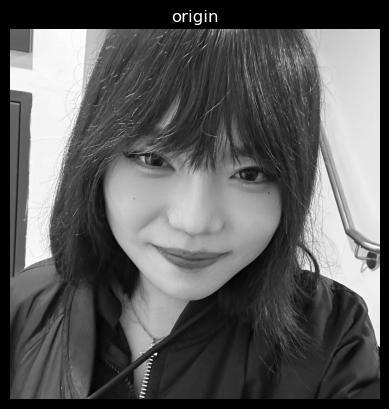

In [22]:
#load the image
img1 = cv2.imread('me.jpg')
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
plt.imshow(img1_gray,cmap='gray')
plt.axis('off')
plt.title('origin')

Text(0.5, 1.0, 'roi')

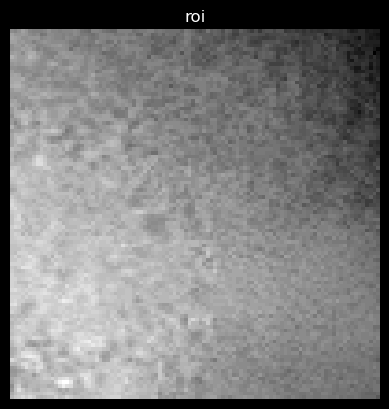

In [23]:
top_left1 = (1000,750)
bottom_right1 = (1100,850)
# top_left1 = (500,750)
# bottom_right1 = (1100,850)
roi = img1_gray[top_left1[1]:bottom_right1[1], top_left1[0]:bottom_right1[0]]
plt.imshow(roi,cmap='gray')
plt.axis('off') 
plt.title('roi')

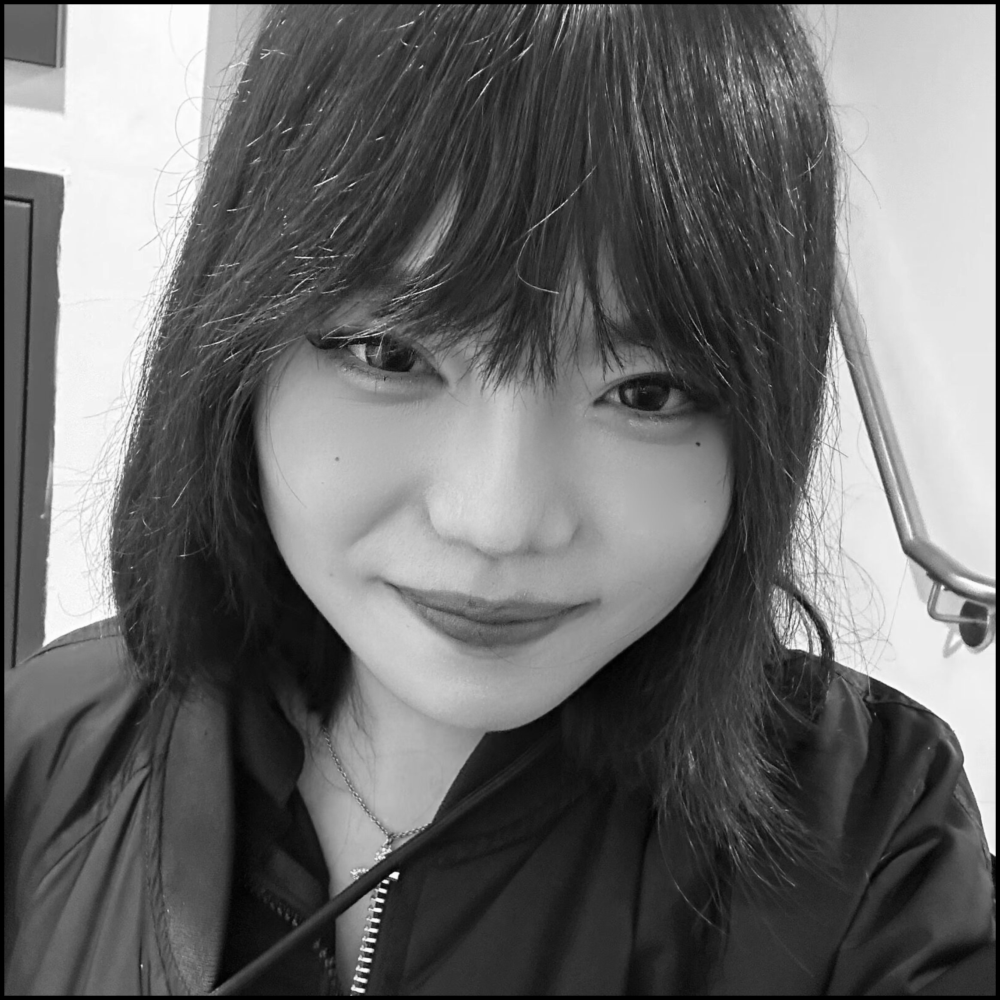

In [24]:

# 假设src_roi和dst_roi是NumPy数组，它们是区域R内的源和目标灰度值
h, w = roi.shape  # 获取区域R的高度和宽度

# 初始化系数矩阵A和向量b
A = lil_matrix((h * w, h * w))
b = np.zeros(h * w)

# 构建系数矩阵A和向量b
for y in range(h):
    for x in range(w):
        index = x + y * w  # 二维到一维的映射
        # 填充系数矩阵A
        A[index, index] = 4  # 中心像素
        if x > 0:
            A[index, index - 1] = -1  # 左侧像素
        if x < w - 1:
            A[index, index + 1] = -1  # 右侧像素
        if y > 0:
            A[index, index - w] = -1  # 上方像素
        if y < h - 1:
            A[index, index + w] = -1  # 下方像素

        # 设置向量b的边界条件
        if y == 0 or y == h-1 or x == 0 or x == w-1:
            b[index] = roi[y, x]  # 使用目标图像的边界值
        else:
            # 对于内部点，b[index]应当设置为拉普拉斯算子的离散近似，这里为0
            b[index] = 0

# 转换系数矩阵A为CSR格式
A_csr = A.tocsr()

# 求解泊松方程
solution = spsolve(A_csr, b)

# 将求解的结果映射回二维图像
solution_img = solution.reshape((h, w))

# 在目标图像dst_roi中填充求解得到的结果
for y in range(h):
    for x in range(w):
        if not (y == 0 or y == h-1 or x == 0 or x == w-1):  # 对非边界点进行填充
            roi[y, x] = solution_img[y, x]

img1_gray[top_left1[1]:bottom_right1[1], top_left1[0]:bottom_right1[0]]=roi
plt.figure(figsize=(30,30))
plt.imshow(img1_gray, cmap='gray')

plt.axis('off')  # 不显示坐标轴
plt.show()


# Task2a Importing gradients

Text(0.5, 1.0, 'tattoo')

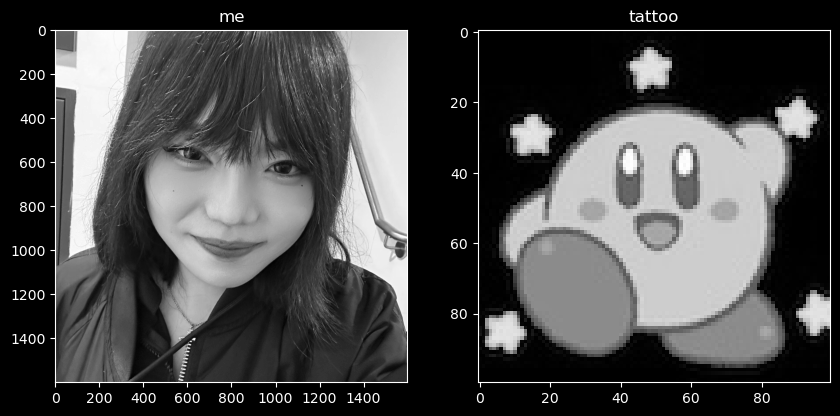

In [25]:
# 读取图像
img1 = cv2.imread('me.jpg')
img2 = cv2.imread('tattoo.jpg')

# 将图像转换为灰度图
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1) 
plt.imshow(img1_gray,cmap='gray')
#plt.axis('off') 
plt.title('me')

plt.subplot(1, 2, 2)
plt.imshow(img2_gray,cmap='gray')
#plt.axis('off')
plt.title('tattoo')

Text(0.5, 1.0, 'src_roi')

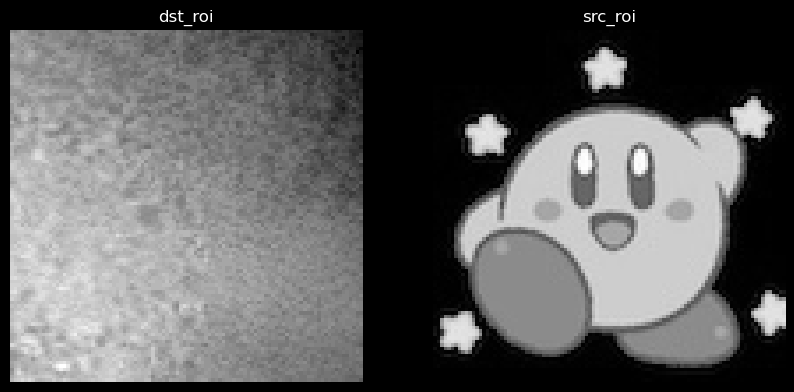

In [26]:
dst_img = img1_gray
src_img = img2_gray

dst_top_left = (1000,750)
dst_bottom_right = (1100,850)
src_top_left = (0, 0)
src_bottom_right = (100, 100)

dst_roi = dst_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0]]
src_roi = src_img[src_top_left[1]:src_bottom_right[1], src_top_left[0]:src_bottom_right[0]]

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1) 
plt.imshow(dst_roi,cmap='gray')
plt.axis('off') 
plt.title('dst_roi')
plt.subplot(1, 2, 2)
plt.imshow(src_roi,cmap='gray')
plt.axis('off')
plt.title('src_roi')

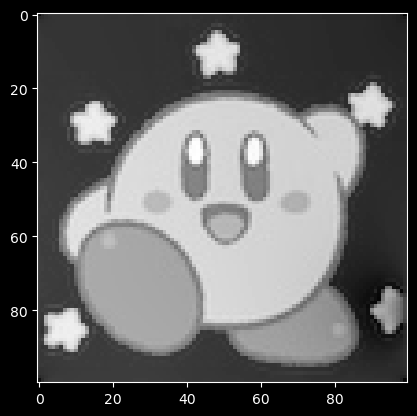

In [27]:
h, w = 100,100
#h, w = 300,300
# 初始化系数矩阵
A = lil_matrix((h * w, h * w))
b = np.zeros(h * w)
# 填充系数矩阵
for i in range(h):
    for j in range(w):
        index = i * w + j
        A[index, index] = 4  # 当前像素的系数
        #"当前像素的系数"指的是方程中该像素自己的系数。
        # 在泊松方程中，这通常是4。
        # 这是因为在泊松方程的离散化过程中，每个像素点的值是由它自己和它的四个直接邻居（上、下、左、右）的值共同决定的。
        # 在系数矩阵中，每个像素对应的行中，该像素自己的位置会被赋值为4，而它的四个邻居则分别赋值为-1。这样构建的矩阵用于表示图像中每个像素点与其邻域的拉普拉斯关系
        if i > 0:
            A[index, index - w] = -1  # 上方像素
        if i < h - 1:
            A[index, index + w] = -1  # 下方像素
        if j > 0:
            A[index, index - 1] = -1  # 左侧像素
        if j < w - 1:
            A[index, index + 1] = -1  # 右侧像素
        
        if i == 0 or i == h-1 or j == 0 or j == w-1:
            # 在边界上，使用目标图像的像素值
            b[index] = dst_roi[i, j]
        else:
            # 在内部，计算源图像的梯度并将其添加到b向量
            # 注意：这里简化了梯度计算；实际应用中可能需要更精细的处理
            b[index] = 4 * src_roi[i, j] - src_roi[i, j+1] - src_roi[i, j-1] - src_roi[i+1, j] - src_roi[i-1, j]


# 将系数矩阵转换为CSR格式，以便后续计算
A_csr = A.tocsr()
# 求解方程组
result = spsolve(A_csr, b)

# 将求解结果映射回图像
# 将一维结果转换为二维图像格式

result_img = result.reshape(h, w)
plt.axis('off')
plt.title('res')
plt.imshow(result_img,cmap='gray')



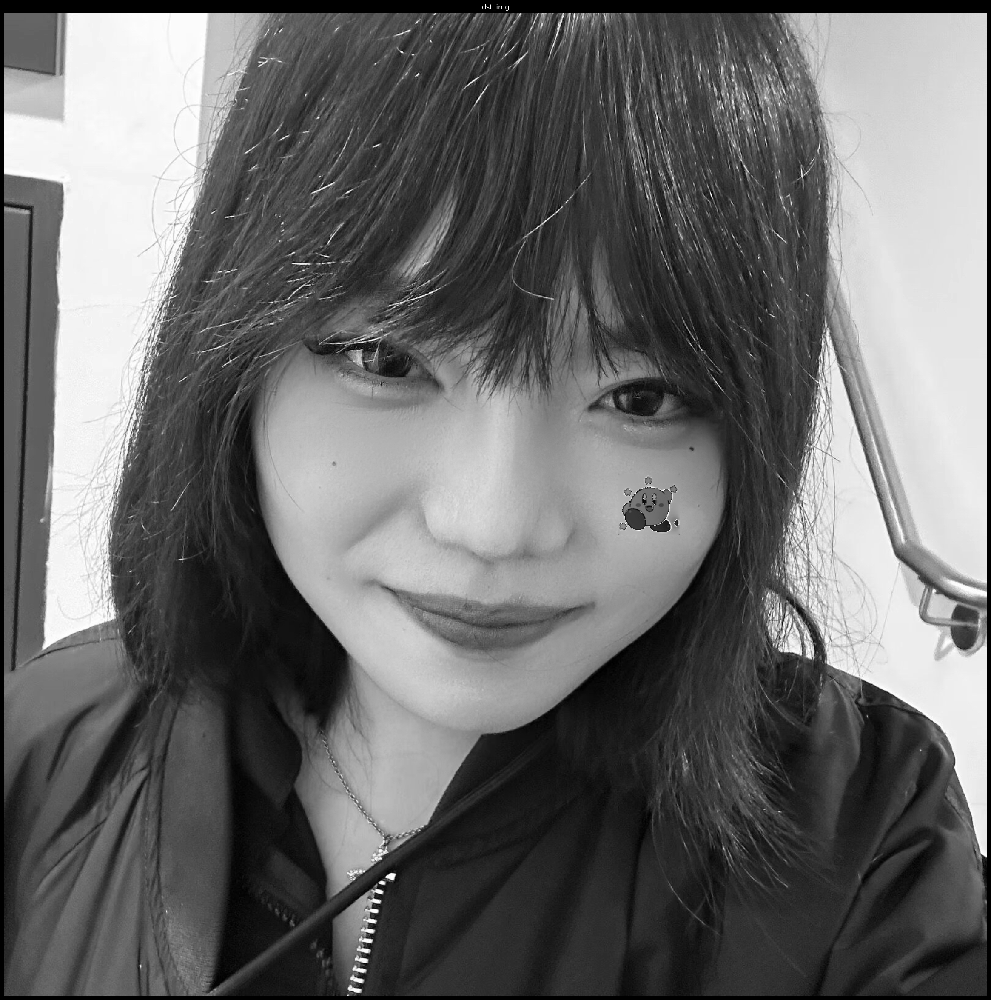

In [29]:
dst_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0]] = result_img
plt.figure(figsize=(30,30))
plt.axis('off')
plt.title('dst_img')
plt.imshow(dst_img,cmap='gray')

# Task2b Mixing Gradients

Text(0.5, 1.0, 'src_roi')

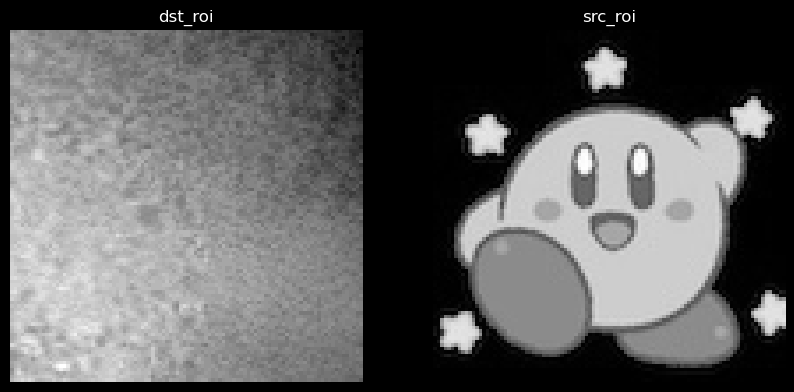

In [30]:
img1 = cv2.imread('me.jpg')
img2 = cv2.imread('tattoo.jpg')
# 将图像转换为灰度图
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

dst_img = img1_gray
src_img = img2_gray

dst_top_left = (1000,750)
dst_bottom_right = (1100,850)
src_top_left = (0, 0)
src_bottom_right = (100, 100)

dst_roi = dst_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0]]
src_roi = src_img[src_top_left[1]:src_bottom_right[1], src_top_left[0]:src_bottom_right[0]]

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1) 
plt.imshow(dst_roi,cmap='gray')
plt.axis('off') 
plt.title('dst_roi')
plt.subplot(1, 2, 2)
plt.imshow(src_roi,cmap='gray')
plt.axis('off')
plt.title('src_roi')

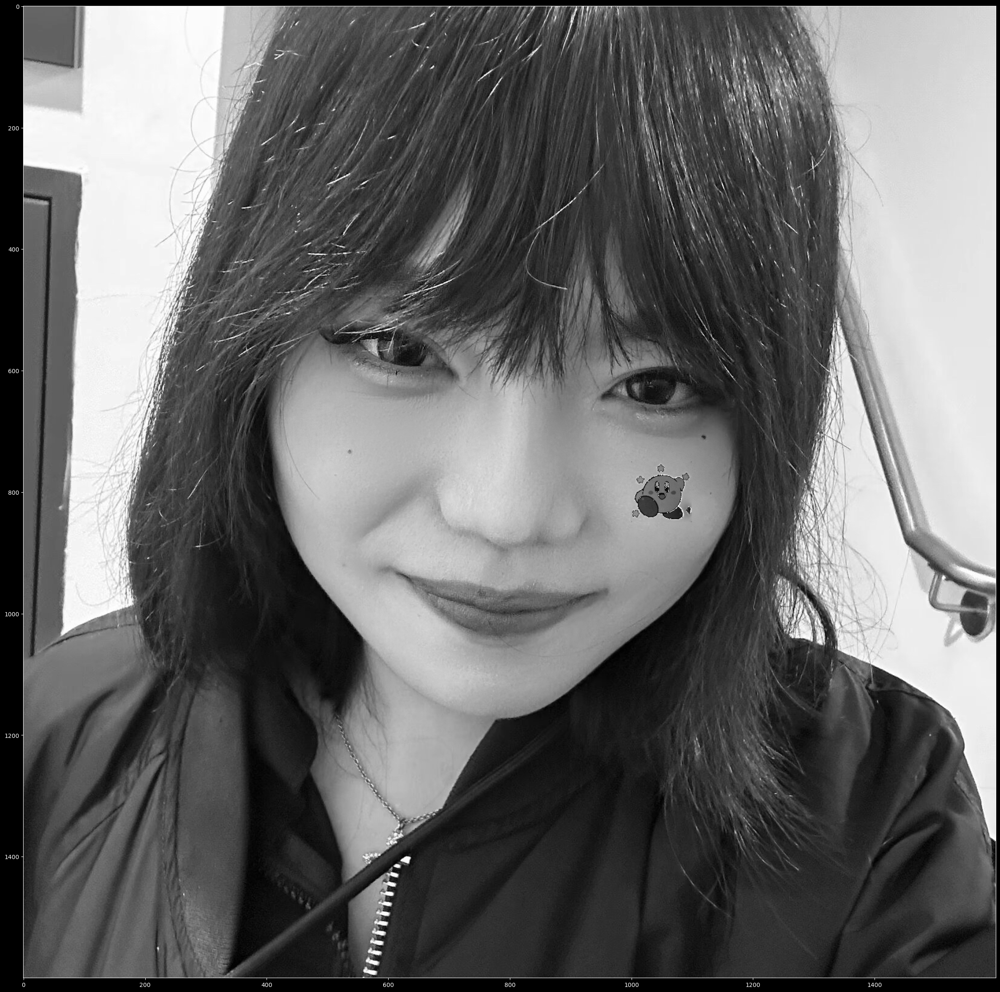

In [31]:
# 计算梯度
src_gradient_x = np.diff(src_roi.astype(np.float32), axis=1, append=0)
src_gradient_y = np.diff(src_roi.astype(np.float32), axis=0, append=0)
dst_gradient_x = np.diff(dst_roi.astype(np.float32), axis=1, append=0)
dst_gradient_y = np.diff(dst_roi.astype(np.float32), axis=0, append=0)

# 初始化混合梯度
mixed_gradient_x = np.zeros_like(src_roi, dtype=np.float32)
mixed_gradient_y = np.zeros_like(src_roi, dtype=np.float32)

# 对于内部像素，选择较大的梯度
for i in range(h):
    for j in range(w):
        if abs(src_gradient_x[i, j]) > abs(dst_gradient_x[i, j]):
            mixed_gradient_x[i, j] = src_gradient_x[i, j]
        else:
            mixed_gradient_x[i, j] = dst_gradient_x[i, j]
        
        if abs(src_gradient_y[i, j]) > abs(dst_gradient_y[i, j]):
            mixed_gradient_y[i, j] = src_gradient_y[i, j]
        else:
            mixed_gradient_y[i, j] = dst_gradient_y[i, j]

# 计算散度，这是梯度场的点源
div_mixed_gradient = np.zeros_like(src_roi, dtype=np.float32)
for i in range(1, h-1):
    for j in range(1, w-1):
        v_pq = mixed_gradient_x[i, j-1]
        v_qp = -mixed_gradient_x[i, j]
        u_pq = mixed_gradient_y[i-1, j]
        u_qp = -mixed_gradient_y[i, j]
        div_mixed_gradient[i, j] = v_pq + v_qp + u_pq + u_qp

# 应用边界条件
for i in range(h):
    for j in range(w):
        index = i * w + j
        if i == 0 or i == h-1 or j == 0 or j == w-1:
            div_mixed_gradient[i, j] += dst_roi[i, j]

# 将散度应用到b向量
b = div_mixed_gradient.flatten()


# 将系数矩阵转换为CSR格式，以便后续计算
A_csr = A.tocsr()

# 求解方程组
result = spsolve(A_csr, b)

# 将求解结果映射回目标图像
result_img = result.reshape(h, w)


# 现在，我们可以将uint8类型的结果映射回目标图像的ROI区域
dst_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0]] = result_img.astype(np.uint8)

plt.figure(figsize=(30,30))
plt.imshow(dst_img,cmap='gray')

# Task3

Text(0.5, 1.0, 'src_roi')

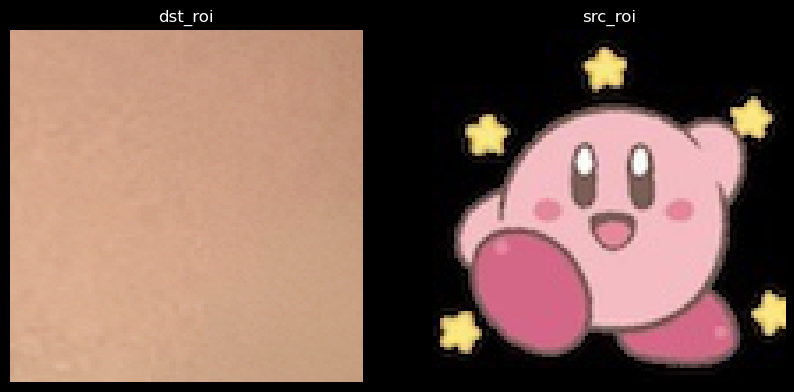

In [65]:
img1 = cv2.imread('me.jpg')
img2 = cv2.imread('tattoo1.jpg')
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

dst_img = img1_rgb
src_img = img2_rgb

dst_top_left = (1000,750)
dst_bottom_right = (1100,850)
src_top_left = (0, 0)
src_bottom_right = (100, 100)

dst_roi = dst_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0]]
src_roi = src_img[src_top_left[1]:src_bottom_right[1], src_top_left[0]:src_bottom_right[0]]

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1) 
plt.imshow(dst_roi,cmap='gray')
plt.axis('off') 
plt.title('dst_roi')
plt.subplot(1, 2, 2)
plt.imshow(src_roi,cmap='gray')
plt.axis('off')
plt.title('src_roi')

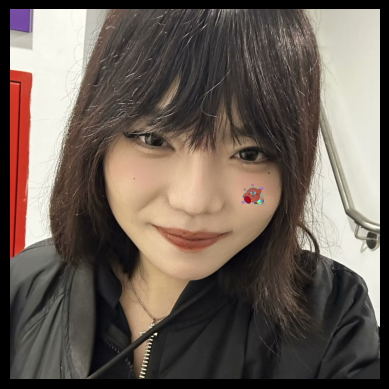

In [67]:
# 以下是根据您提供的C++代码示例修改后的Python代码，用于处理彩色图像的无缝克隆
# 使用“importing gradients”方法

import numpy as np
from scipy.sparse import lil_matrix
from scipy.sparse.linalg import spsolve
import matplotlib.pyplot as plt

# 假设src_img和dst_img是彩色图像的NumPy数组
# 假设我们已经有了每个图像的ROI区域，对于源图像是src_roi，对于目标图像是dst_roi
# h和w是这些区域的高度和宽度

# 初始化结果图像为目标图像的拷贝
result_img = np.copy(dst_img)

# 对每个颜色通道分别处理
for channel in range(3):
    # 提取当前通道的源和目标ROI
    src_roi_channel = src_roi[:, :, channel].astype(np.float32)
    dst_roi_channel = dst_roi[:, :, channel].astype(np.float32)
    
    # 计算源图像梯度
    src_gradient_x = np.diff(src_roi_channel, axis=1, append=np.zeros((h, 1)))
    src_gradient_y = np.diff(src_roi_channel, axis=0, append=np.zeros((1, w)))
    
    # 初始化系数矩阵A和向量b
    A = lil_matrix((h * w, h * w))
    b = np.zeros((h * w,))
    
    # 构建系数矩阵A和向量b
    for y in range(h):
        for x in range(w):
            index = y * w + x
            A[index, index] = 4
            if x > 0:
                A[index, index - 1] = -1
            if x < w - 1:
                A[index, index + 1] = -1
            if y > 0:
                A[index, index - w] = -1
            if y < h - 1:
                A[index, index + w] = -1
            
            # 计算源图像的梯度散度
            div = src_gradient_x[y, x-1] - src_gradient_x[y, x] + src_gradient_y[y-1, x] - src_gradient_y[y, x]
            b[index] = div

    # 边界条件
    for y in range(h):
        for x in range(w):
            index = y * w + x
            if y == 0 or y == h-1 or x == 0 or x == w-1:
                b[index] = dst_roi_channel[y, x]

    # 转换A为CSR格式并求解方程
    A_csr = A.tocsr()
    solution = spsolve(A_csr, b)

    # 将结果映射回图像
    solution_img_channel = solution.reshape((h, w))

    # 在目标图像中更新对应通道的ROI
    result_img[dst_top_left[1]:dst_bottom_right[1], dst_top_left[0]:dst_bottom_right[0], channel] = solution_img_channel

# 转换结果为uint8类型并显示
#result_img_uint8 = np.clip(result_img, 0, 255).astype(np.uint8)
plt.imshow(result_img.astype(np.uint8))
plt.axis('off')  # 隐藏坐标轴
plt.show()



# Task4 local colour change

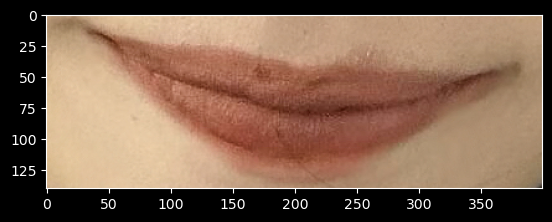

In [90]:
img = cv2.imread('me.jpg')
img = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
top_left=(580,920)
bottom_right=(980,1060)
roi = img[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
plt.imshow(roi)

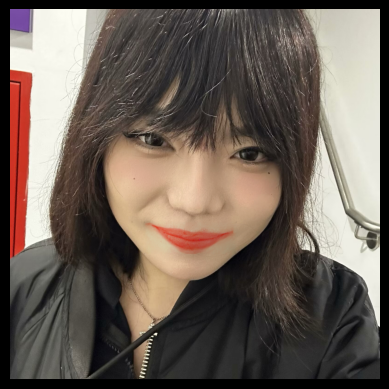

In [92]:
h, w = roi.shape[:2]

# 定义要改变的颜色（例如，更亮或更暗的口红颜色）
# 通过增加红色通道的值来改变颜色
# 
color_change = [100, 0, 0]  # 增加红色通道的值

# 将ROI转换为浮点数并应用颜色变化
roi_float = roi.astype(np.float32)
roi_changed = np.clip(roi_float + color_change, 0, 255)

# 计算梯度（我们只关心颜色变化后的ROI）
gradient_x = np.diff(roi_changed, axis=1, prepend=roi_changed[:, :1])
gradient_y = np.diff(roi_changed, axis=0, prepend=roi_changed[:1, :])

# 初始化系数矩阵A和向量b
A = lil_matrix((h * w, h * w))
b = np.zeros((h * w, 3))  # 对于RGB图像

# 构建系数矩阵A和向量b
for y in range(h):
    for x in range(w):
        index = y * w + x
        A[index, index] = 4
        if x > 0:
            A[index, index - 1] = -1
        if x < w - 1:
            A[index, index + 1] = -1
        if y > 0:
            A[index, index - w] = -1
        if y < h - 1:
            A[index, index + w] = -1

        # 设置向量b的边界条件
        if y == 0 or y == h-1 or x == 0 or x == w-1:
            b[index, :] = img[top_left[1]+y, top_left[0]+x, :]
        else:
            # 计算梯度的散度
            div = gradient_x[y, x-1] - gradient_x[y, x] + gradient_y[y-1, x] - gradient_y[y, x]
            b[index, :] = div

# 转换A为CSR格式
A_csr = A.tocsr()

# 分别为每个颜色通道求解泊松方程
for channel in range(3):
    solution = spsolve(A_csr, b[:, channel])
    solution_img = solution.reshape((h, w))
    roi[:,:,channel]= solution_img

# 更新原始图像中的ROI区域
img[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]] = roi

# 显示结果
plt.imshow(img)
plt.axis('off')
plt.show()
